In [1]:
#Import the necessary packages
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.dates import DateFormatter
#%matplotlib inline
import seaborn as sns
from datetime import datetime
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots


In [2]:
#Load dataset
covid_19 = pd.read_csv('United_States_COVID-19.csv')
covid_19.head(10)

,submission_date,state,tot_cases,conf_cases,prob_cases,new_case,pnew_case,tot_death,conf_death,prob_death,new_death,pnew_death,created_at,consent_cases,consent_deaths
0,03/11/2021,KS,297229,241035.0,56194.0,0,0.0,4851,NaN,NaN,0,0.0,03/12/2021 03:20:13 PM,Agree,NaN
1,12/01/2021,ND,163565,135705.0,27860.0,589,220.0,1907,NaN,NaN,9,0.0,12/02/2021 02:35:20 PM,Agree,Not agree
2,01/02/2022,AS,11,NaN,NaN,0,0.0,0,NaN,NaN,0,0.0,01/03/2022 03:18:16 PM,NaN,NaN
3,11/22/2021,AL,841461,620483.0,220978.0,703,357.0,16377,12727.0,3650.0,7,3.0,11/22/2021 12:00:00 AM,Agree,Agree
4,05/30/2022,AK,251425,NaN,NaN,0,0.0,1252,NaN,NaN,0,0.0,05/31/2022 01:20:20 PM,NaN,NaN
5,05/17/2020,RMI,0,0.0,0.0,0,0.0,0,0.0,0.0,0,0.0,05/18/2020 04:01:54 PM,Agree,Agree
6,04/03/2020,ND,173,NaN,NaN,14,NaN,3,NaN,NaN,0,NaN,04/03/2020 04:22:39 PM,Agree,Not agree
7,09/04/2021,PR,173967,144788.0,29179.0,667,274.0,2911,2482.0,429.0,8,3.0,09/04/2021 12:00:00 AM,Agree,Agree
8,05/09/2021,PW,0,NaN,NaN,0,0.0,0,NaN,NaN,0,0.0,05/10/2021 02:15:36 PM,NaN,NaN
9,08/15/2022,NM,602931,NaN,NaN,1509,0.0,8318,NaN,NaN,6,0.0,08/16/2022 01:14:12 PM,NaN,Not agree


In [3]:
#Missing values
covid_19.isna().sum()

submission_date        0
state                  0
tot_cases              0
conf_cases         26026
prob_cases         26098
new_case               0
pnew_case           3526
tot_death              0
conf_death         26787
prob_death         26787
new_death              0
pnew_death          3494
created_at             0
consent_cases      10015
consent_deaths      9009
dtype: int64

In [4]:
covid_19.shape

(60060, 15)

In [5]:
#Structure
covid_19.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60060 entries, 0 to 60059
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   submission_date  60060 non-null  object 
 1   state            60060 non-null  object 
 2   tot_cases        60060 non-null  int64  
 3   conf_cases       34034 non-null  float64
 4   prob_cases       33962 non-null  float64
 5   new_case         60060 non-null  int64  
 6   pnew_case        56534 non-null  float64
 7   tot_death        60060 non-null  int64  
 8   conf_death       33273 non-null  float64
 9   prob_death       33273 non-null  float64
 10  new_death        60060 non-null  int64  
 11  pnew_death       56566 non-null  float64
 12  created_at       60060 non-null  object 
 13  consent_cases    50045 non-null  object 
 14  consent_deaths   51051 non-null  object 
dtypes: float64(6), int64(4), object(5)
memory usage: 6.9+ MB


In [6]:
#Converting "submission date" into Datetime format
covid_19['submission_date'] = pd.to_datetime(covid_19['submission_date'])

In [7]:
covid_19.head(3)

,submission_date,state,tot_cases,conf_cases,prob_cases,new_case,pnew_case,tot_death,conf_death,prob_death,new_death,pnew_death,created_at,consent_cases,consent_deaths
0,2021-03-11,KS,297229,241035.0,56194.0,0,0.0,4851,NaN,NaN,0,0.0,03/12/2021 03:20:13 PM,Agree,NaN
1,2021-12-01,ND,163565,135705.0,27860.0,589,220.0,1907,NaN,NaN,9,0.0,12/02/2021 02:35:20 PM,Agree,Not agree
2,2022-01-02,AS,11,NaN,NaN,0,0.0,0,NaN,NaN,0,0.0,01/03/2022 03:18:16 PM,NaN,NaN


In [8]:
#Drop missing values
covid_19.dropna(inplace=True)

In [9]:
covid_19.isna().sum()

submission_date    0
state              0
tot_cases          0
conf_cases         0
prob_cases         0
new_case           0
pnew_case          0
tot_death          0
conf_death         0
prob_death         0
new_death          0
pnew_death         0
created_at         0
consent_cases      0
consent_deaths     0
dtype: int64

In [10]:
#Dimension
covid_19.shape

(27977, 15)

In [11]:
covid_19.tail(4)

,submission_date,state,tot_cases,conf_cases,prob_cases,new_case,pnew_case,tot_death,conf_death,prob_death,new_death,pnew_death,created_at,consent_cases,consent_deaths
60046,2020-02-20,AL,0,0.0,0.0,0,0.0,0,0.0,0.0,0,0.0,02/20/2020 12:00:00 AM,Agree,Agree
60048,2021-09-25,RMI,4,4.0,0.0,0,0.0,0,0.0,0.0,0,0.0,09/27/2021 01:21:43 PM,Agree,Agree
60058,2020-06-17,MS,24223,24038.0,185.0,521,6.0,1191,1172.0,19.0,9,0.0,06/19/2020 12:00:00 AM,Agree,Agree
60059,2022-05-07,MA,1779829,1638144.0,141685.0,0,0.0,20334,19198.0,1136.0,0,0.0,05/09/2022 01:14:40 PM,Agree,Agree


In [12]:
covid_19.columns

Index(['submission_date', 'state', 'tot_cases', 'conf_cases', 'prob_cases',
       'new_case', 'pnew_case', 'tot_death', 'conf_death', 'prob_death',
       'new_death', 'pnew_death', 'created_at', 'consent_cases',
       'consent_deaths'],
      dtype='object')

In [13]:
covid_19.sort_values('tot_cases', ascending=False).head(2)

,submission_date,state,tot_cases,conf_cases,prob_cases,new_case,pnew_case,tot_death,conf_death,prob_death,new_death,pnew_death,created_at,consent_cases,consent_deaths
27702,2021-10-28,CA,4885289,4640489.0,244800.0,8770,3821.0,71408,71408.0,0.0,113,0.0,10/30/2021 12:00:00 AM,Agree,Agree
16198,2021-10-27,CA,4855054,4635540.0,219514.0,4378,0.0,71295,71295.0,0.0,113,0.0,10/29/2021 12:00:00 AM,Agree,Agree


### Decriptive statistics

#### Total Cases

In [14]:
def get_total_cases(df_total):
    total_cases = np.sum(covid_19['tot_cases'])
    total_conf_cases = np.sum(covid_19['conf_cases'])
    total_deaths= np.sum(covid_19['tot_death'])
    total_conf_deaths = np.sum(covid_19['conf_death'])
    total_mortality_rate = np.round((np.sum(covid_19['conf_death']) / np.sum(covid_19['conf_cases']) * 100), 2)
    data = {
        'Total cases': [total_cases],
        'Deaths': [total_deaths],
        'Total Confirmed Cases': [total_conf_cases],
        'Total Confirmed death': [total_conf_deaths],
        'Mortality Rate %': [total_mortality_rate]
    }
    df_total = pd.DataFrame(data)
    return df_total

In [15]:
df_total = get_total_cases(covid_19).style.hide_index().background_gradient(cmap='Wistia', axis=1)
df_total

C:\Users\MY PC\AppData\Local\Temp\ipykernel_4436\869306356.py:1: FutureWarning: this method is deprecated in favour of `Styler.hide(axis='index')`
  df_total = get_total_cases(covid_19).style.hide_index().background_gradient(cmap='Wistia', axis=1)


Total cases,Deaths,Total Confirmed Cases,Total Confirmed death,Mortality Rate %
19580497292,291026110,16678183421.000000,257372973.000000,1.540000


In [16]:
# Sort total number of cases 
covid_19.sort_values('conf_cases', ascending=True).describe().head(10).T

,count,mean,std,min,25%,50%,75%,max
tot_cases,27977.0,699878.374808,850345.736829,0.0,59514.0,360321.0,1006327.0,4885289.0
conf_cases,27977.0,596139.093577,750652.149053,0.0,52106.0,304171.0,869590.0,4640489.0
prob_cases,27977.0,103739.338099,152734.577584,0.0,31.0,27901.0,148134.0,763762.0
new_case,27977.0,1749.246881,4051.631016,-4803.0,29.0,535.0,1832.0,125572.0
pnew_case,27977.0,294.912392,783.572885,-6259.0,0.0,33.0,262.0,18072.0
tot_death,27977.0,10402.334418,12098.881484,0.0,1137.0,5154.0,16556.0,71408.0
conf_death,27977.0,9199.448583,11040.241549,0.0,1079.0,4686.0,14287.0,71408.0
prob_death,27977.0,1202.885835,1641.852397,0.0,0.0,319.0,1983.0,7889.0
new_death,27977.0,19.457626,46.617508,-352.0,0.0,5.0,20.0,1178.0
pnew_death,27977.0,2.372020,24.398251,-2594.0,0.0,0.0,2.0,1021.0


## Data Visualization

### Total Confirmed Deaths by State

In [17]:
fig = go.Figure(data=[
    go.Pie(labels=covid_19['state'], 
           values=covid_19['conf_death'], 
           hole=.35,
           textinfo='label+percent'
          )
])

fig.update_layout(
    title_text="US Total Confirmed Deaths by State",
    # Add annotations in the center of the donut pies.
    annotations=[
        dict(text='Deaths<br>Cases', showarrow=False),
    ]
)
fig.update_traces(textposition='inside')
fig.update_layout(margin={"r":0,"l":0,"b":0})
fig.show()

In [32]:
top_states=covid_19.groupby('state')['tot_cases','tot_death'].sum().sort_values(by= 'tot_cases',ascending=False)

C:\Users\MY PC\AppData\Local\Temp\ipykernel_4436\3946721247.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



C:\Users\MY PC\AppData\Local\Temp\ipykernel_4436\1994077348.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



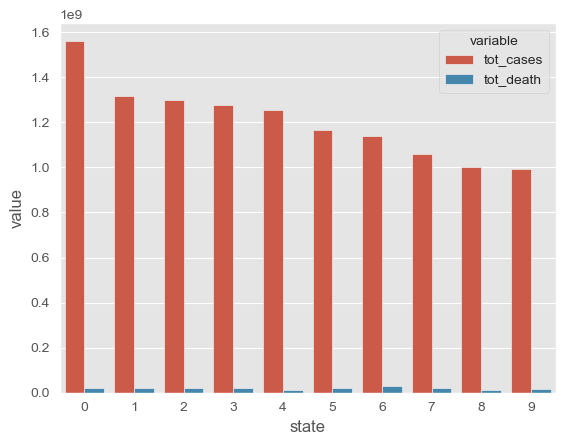

In [33]:
top_states=covid_19.groupby('state')['tot_cases','tot_death'].sum().sort_values(by= 'tot_cases',ascending=False)
top_states['state']=state.index
df_long = pd.melt(top_states, id_vars=['state'] , value_vars=['tot_cases','tot_death'])
top = state.index[:10]

df_top = df_long[df_long['state'].isin(top)]

plt.style.use('ggplot')
ax = sns.barplot(x = 'state', hue="variable", y="value", data=df_top)

# death rate by state

In [18]:
state = covid_19.groupby(['state']).sum().reset_index()[['state','conf_cases','conf_death']]
state = state.sort_values(by='state')
state['death_rate'] = state.conf_death / state.conf_cases

In [19]:
state.groupby('state').max().sort_values('death_rate', ascending=False).head()

,conf_cases,conf_death,death_rate
state,,,
NYC,9.648760e+08,24910276.0,0.025817
MS,2.309648e+08,5002470.0,0.021659
NJ,9.162550e+08,17265102.0,0.018843
OH,1.032921e+09,19165286.0,0.018554
MI,1.023664e+09,18483885.0,0.018057


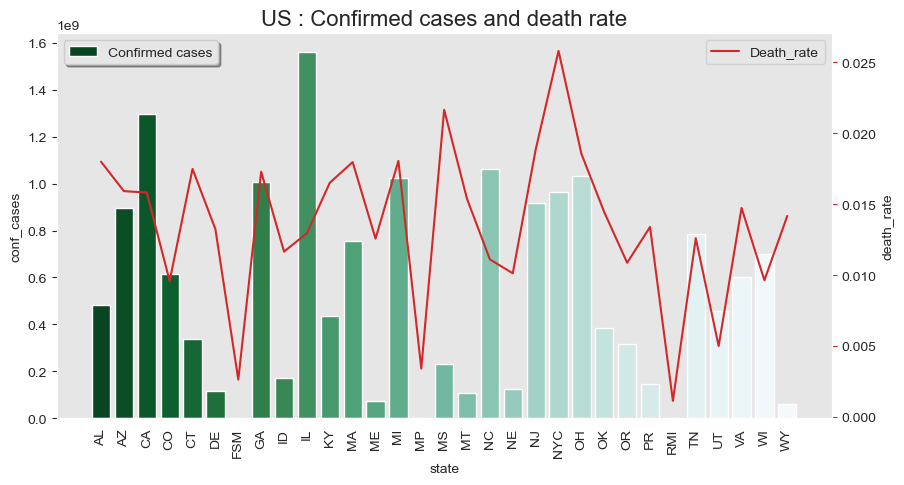

In [20]:
sns.set_style("darkgrid", {"axes.facecolor": ".9"})
fig, ax1 = plt.subplots(figsize=(10,5))
color = 'tab:blue'
ax1.set_title('US : Confirmed cases and death rate', fontsize=16)
ax1 = sns.barplot(x=state['state'], y=state['conf_cases'], palette='BuGn_r',label = 'Confirmed cases',ax=ax1)
ax1.tick_params(axis='y')
ax1.set_xticklabels(ax1.get_xticklabels(),rotation=90)
ax1.legend(loc = 'upper left', shadow=True)
ax1.grid(False)

ax2 = ax1.twinx()
color = 'tab:red'
ax2 = sns.lineplot(x=state['state'], y=state['death_rate'] ,color=color,palette='BuGn_r', label = 'Death_rate',ax=ax2)
ax2.set_xticklabels(ax1.get_xticklabels(),rotation=90)
ax2.tick_params(axis='y', color=color)
ax2.grid(False)

### Total Confirmed Cases by State

In [21]:
fig = go.Figure(data=[
    go.Pie(labels=covid_19['state'], 
           values=covid_19['conf_cases'], 
           hole=.35,
           textinfo='label+percent'
          )
])

fig.update_layout(
    title_text="US Total Confirmed Cases by State",
    # Add annotations in the center of the donut pies.
    annotations=[
        dict(text='Confirmed<br>Cases', showarrow=False),
    ]
)
fig.update_traces(textposition='inside')
fig.update_layout(margin={"r":0,"l":0,"b":0})
fig.show()

### Number of New Deaths by State

In [22]:
fig = go.Figure(data=[
    go.Pie(labels=covid_19['state'], 
           values=covid_19['new_death'], 
           hole=.35,
           textinfo='label+percent'
          )
])

fig.update_layout(
    title_text="US Number of New Deaths by States",
    # Add annotations in the center of the donut pies.
    annotations=[
        dict(text='New<br>Death', showarrow=False),
    ]
)
fig.update_traces(textposition='inside')
fig.update_layout(margin={"r":0,"l":0,"b":0})
fig.show()

## Trend - Time Series

In [23]:
covid_19.columns

Index(['submission_date', 'state', 'tot_cases', 'conf_cases', 'prob_cases',
       'new_case', 'pnew_case', 'tot_death', 'conf_death', 'prob_death',
       'new_death', 'pnew_death', 'created_at', 'consent_cases',
       'consent_deaths'],
      dtype='object')

In [24]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=covid_19['submission_date'], y=covid_19['tot_cases'], 
                         mode='lines', name='Total Confirmed'))
fig.add_trace(go.Scatter(x=covid_19['submission_date'], y=covid_19['tot_death'], 
                         mode='lines', name='Total Deaths'))
fig.add_trace(go.Scatter(x=covid_19['submission_date'], y=covid_19['new_case'], 
                         mode='lines', name='New Cases'))


fig.update_layout(
        xaxis_title="",
        yaxis_title="Cases Count in Log Scale",
        title = 'Time Series - Total Confirmed Cases, New Cases & Total Deaths in USA',
        yaxis_type='log'
    )
fig.update_layout(
    legend=dict(
        x=0,
        y=1,
        traceorder="normal",
        bgcolor="LightSteelBlue",
        bordercolor="silver",
        borderwidth=1
    )
)
fig.update_layout(margin={"r":0,"l":0,"b":0})
fig.show()